# Project Flat

This was a small data extraction, processing, and visualization work I did for hobby and learning over a weekend. I use the beautifulsoup library to extract data from a major Japanese real estate portal, then I do some geoprocessing using QGIS. I load the data back to Python and use the folium library to build an interactive map of Tokyo highlighting areas of high average rent prices.

This is the real estate portal (in Japanese): https://www.chintai.net/

In [1]:
# import necessary libraries
from bs4 import BeautifulSoup
import pandas as pd
import requests
import numpy as np
import time
import random

### 1) Scrape data from Chintai.net
Chintai.net is one of the biggest real estate portals in Japan. It has information on flats available for rental, but also aggregated data on the rental market in Japan. Its database is massive and covers the whole country. For this project, I limit the data extraction to Tokyo and in this notebook I will only show the results for a couple of districts for demonstration purposis. The final output will have all Tokyo districts. 

One of the fun facts that I learned when I came to Japan is that the Tokyo is not exactly a city, but a prefecture that includes cities and wards. What we know as the "city of Tokyo" is not an actual city, but a region containing the 23 biggest cities (or "wards", as it is also known in Japan).

In [2]:
# set request and create soup containing the list of Tokyo cities 
site_city = "https://www.chintai.net/rent/tokyo/area/"
resp_city = requests.get(site_city, timeout=5)
soup_city = BeautifulSoup(resp_city.content, "html.parser")

See below the first 15 Tokyo cities I scrapped from the real estate portal. Each city has its URL which contains information of its districts ("Oaza" in Japanese). 
<br>
In the following steps, I loop through each city and then I loop again through each district to get the URL that contains the average rental price that I need.
I scraped a total of 1318 districts from the real estate portal.

In [3]:
# parse the soup and create a dataframe containing Tokyo cities and URLs
city = []
citylink = []

parenturl = "https://www.chintai.net"
for k in soup_city.findAll("p", class_="name"):
    row = k.find("a", href=True)
    city.append(row.text)
    citylink.append(parenturl+row["href"])

linklist = {}
linklist["city"] = city
linklist["link"] = citylink

pd.DataFrame(linklist).head(15)

,city,link
0,千代田区,https://www.chintai.net/tokyo/area/13101/rent/
1,中央区,https://www.chintai.net/tokyo/area/13102/rent/
2,港区,https://www.chintai.net/tokyo/area/13103/rent/
3,新宿区,https://www.chintai.net/tokyo/area/13104/rent/
4,文京区,https://www.chintai.net/tokyo/area/13105/rent/
5,台東区,https://www.chintai.net/tokyo/area/13106/rent/
6,墨田区,https://www.chintai.net/tokyo/area/13107/rent/
7,江東区,https://www.chintai.net/tokyo/area/13108/rent/
8,品川区,https://www.chintai.net/tokyo/area/13109/rent/
9,目黒区,https://www.chintai.net/tokyo/area/13110/rent/


In [4]:
# Loop through each city and get its source code. Transform thes source codes e into a soup and store in "citysoup" list.
citysoup = []
for n,k in list(enumerate(citylink)):
    sleep = random.randint(1,3)
    time.sleep(sleep)
    resp_distr = requests.get(k, timeout=5)
    citysoup.append(BeautifulSoup(resp_distr.content, "html.parser"))

In [5]:
# Parse each city soup and extract the district links that give access to actual rent data. 
# Store district names and links into a datamframe called "linklist_oaza" 
oazalinks = []
oazaname = []
city_oaza = []
for n,c in list(enumerate(city)):
    for p in citysoup[n].findAll("p", class_="name"):
        oazalinks.append(p.find("a", href=True)["href"])
        oazaname.append(p.text)
        city_oaza.append(c)
        
linklist_oaza = pd.DataFrame(dict(city=city_oaza, oaza=oazaname, link=oazalinks, ))
linklist_oaza

,city,oaza,link
0,千代田区,飯田橋,/tokyo/area/13101001/rent/
1,千代田区,一番町,/tokyo/area/13101002/rent/
2,千代田区,岩本町,/tokyo/area/13101003/rent/
3,千代田区,内神田,/tokyo/area/13101004/rent/
4,千代田区,鍛冶町,/tokyo/area/13101007/rent/
...,...,...,...
1312,西多摩郡瑞穂町,大字箱根ケ崎,/tokyo/area/13303008/rent/
1313,西多摩郡瑞穂町,長岡,/tokyo/area/13303012/rent/
1314,西多摩郡瑞穂町,箱根ケ崎西松原,/tokyo/area/13303013/rent/
1315,西多摩郡瑞穂町,南平,/tokyo/area/13303015/rent/


There are 5 major types of flats in Tokyo
- 1R: one bedroom
- 1K: kitchen and one bedroom
- 1LDK: kitchen, living room one bedroom
- 2LDK: kitchen, living room two bedrooms
- 3LDK: kitchen, living room three bedrooms

Below I loop though each district URL and get the average rent price for whateaver flat type is available in the portal. Not all districts have information for all flat types, so I need to be carefull not to input wrong data in the wrong place. I scrape the first 20 Tokyo districts as a sample. 

In [6]:
# now it is time to actually get the data that I need - average rent prices for each district for each flat type (1R, 1K, 1LDK, 2LDK, 3LDK)
# I scrape the 20 first rows (see workingtbl_sample) and store the results in a list called "rent_type"

workingtbl_sample = linklist_oaza.iloc[:20].copy()

rent_type = []
# for x in range(tst.shape[0]):
for x in range(workingtbl_sample.shape[0]):
    site_data = parenturl+workingtbl_sample.iloc[x]["link"]
    sleep = random.randint(1,5)
    time.sleep(sleep)
    resp_data = requests.get(site_data, timeout=5)
    soup_data = BeautifulSoup(resp_data.content, "html.parser")
    flattype = [name.text.strip() for name in soup_data.findAll("p", class_="name")]
    rent = [rent.text.strip() for rent in soup_data.findAll("span", class_="rent")]
    rent_type.append(dict(zip(flattype,rent)))
    print("finished row {a} -- {b} ({c})".format(a=x, b=workingtbl_sample.iloc[x]["oaza"], c=workingtbl_sample.iloc[x]["link"]))

finished row 0 -- 飯田橋 (/tokyo/area/13101001/rent/)
finished row 1 -- 一番町 (/tokyo/area/13101002/rent/)
finished row 2 -- 岩本町 (/tokyo/area/13101003/rent/)
finished row 3 -- 内神田 (/tokyo/area/13101004/rent/)
finished row 4 -- 鍛冶町 (/tokyo/area/13101007/rent/)
finished row 5 -- 神田淡路町 (/tokyo/area/13101010/rent/)
finished row 6 -- 神田小川町 (/tokyo/area/13101013/rent/)
finished row 7 -- 神田佐久間町 (/tokyo/area/13101018/rent/)
finished row 8 -- 神田神保町 (/tokyo/area/13101019/rent/)
finished row 9 -- 神田須田町 (/tokyo/area/13101020/rent/)
finished row 10 -- 神田駿河台 (/tokyo/area/13101021/rent/)
finished row 11 -- 神田多町 (/tokyo/area/13101022/rent/)
finished row 12 -- 神田司町 (/tokyo/area/13101023/rent/)
finished row 13 -- 神田錦町 (/tokyo/area/13101025/rent/)
finished row 14 -- 神田西福田町 (/tokyo/area/13101026/rent/)
finished row 15 -- 神田東紺屋町 (/tokyo/area/13101029/rent/)
finished row 16 -- 神田東松下町 (/tokyo/area/13101030/rent/)
finished row 17 -- 九段北 (/tokyo/area/13101037/rent/)
finished row 18 -- 九段南 (/tokyo/area/13101038/rent

In [7]:
# Add rent_type list to the workingtbl_sample table. Note how each list item sits at its corresponding district.  
workingtbl_sample["rent_type"] = rent_type
workingtbl_sample

,city,oaza,link,rent_type
0,千代田区,飯田橋,/tokyo/area/13101001/rent/,"{'ワンルーム(1R)': '13.30万円', '1K': '9.85万円', '1DK'..."
1,千代田区,一番町,/tokyo/area/13101002/rent/,{}
2,千代田区,岩本町,/tokyo/area/13101003/rent/,"{'ワンルーム(1R)': '9.70万円', '1K': '9.40万円', '1DK':..."
3,千代田区,内神田,/tokyo/area/13101004/rent/,{'1K': '11.30万円'}
4,千代田区,鍛冶町,/tokyo/area/13101007/rent/,{}
5,千代田区,神田淡路町,/tokyo/area/13101010/rent/,{}
6,千代田区,神田小川町,/tokyo/area/13101013/rent/,{'1K': '11.70万円'}
7,千代田区,神田佐久間町,/tokyo/area/13101018/rent/,"{'1K': '8.80万円', '1LDK': '13.10万円'}"
8,千代田区,神田神保町,/tokyo/area/13101019/rent/,"{'ワンルーム(1R)': '10.90万円', '1K': '11.00万円', '1LD..."
9,千代田区,神田須田町,/tokyo/area/13101020/rent/,"{'ワンルーム(1R)': '8.70万円', '1K': '9.90万円', '1DK':..."


Now I need to parse the rent_type column so that I can have the same flat types sitting in the same column. 
<br>
If a district has all types of flats, then all five columns (1R, 1K, 1LKD, 2LKD, 3LKD) will be populated. If no data is available for a particular flat type, then assign "NA".

In [8]:
# In the loop below, I check every cell of rent_type column in workingtbl_sample dataframe. Python will find dictionaries whose keys are the "flat types" and values are the "rent amounts". 
# Python will append whataver value it finds inside each key to the one of the lists below:
onek = [] 
oneldk = [] 
oneroom = [] 
twoldk = []
threeldk = []

# if data for a specific flat type is missing, then I input NA.
for row in range(workingtbl_sample.shape[0]):
    try:
        onek.append(workingtbl_sample.iloc[row]["rent_type"]["1K"])
    except:
        onek.append("NA")
    try:
        oneldk.append(workingtbl_sample.iloc[row]["rent_type"]["1LDK"])
    except:
        oneldk.append("NA")
    try:
        oneroom.append(workingtbl_sample.iloc[row]["rent_type"]["ワンルーム(1R)"])
    except:
        oneroom.append("NA")
    try:
        twoldk.append(workingtbl_sample.iloc[row]["rent_type"]["2LDK"])
    except:
        twoldk.append("NA")
    try:
        threeldk.append(workingtbl_sample.iloc[row]["rent_type"]["3LDK"])
    except:
        threeldk.append("NA")

# Now I add the flat type lists to the workingtbl_sample dataframe.
workingtbl_sample["1R"] = oneroom
workingtbl_sample["1K"] = onek
workingtbl_sample["1LDK"] = oneldk
workingtbl_sample["2LDK"] = twoldk
workingtbl_sample["3LDK"] = threeldk

#check result
workingtbl_sample

,city,oaza,link,rent_type,1R,1K,1LDK,2LDK,3LDK
0,千代田区,飯田橋,/tokyo/area/13101001/rent/,"{'ワンルーム(1R)': '13.30万円', '1K': '9.85万円', '1DK'...",13.30万円,9.85万円,20.70万円,30.90万円,NA
1,千代田区,一番町,/tokyo/area/13101002/rent/,{},NA,NA,NA,NA,NA
2,千代田区,岩本町,/tokyo/area/13101003/rent/,"{'ワンルーム(1R)': '9.70万円', '1K': '9.40万円', '1DK':...",9.70万円,9.40万円,15.00万円,NA,NA
3,千代田区,内神田,/tokyo/area/13101004/rent/,{'1K': '11.30万円'},NA,11.30万円,NA,NA,NA
4,千代田区,鍛冶町,/tokyo/area/13101007/rent/,{},NA,NA,NA,NA,NA
5,千代田区,神田淡路町,/tokyo/area/13101010/rent/,{},NA,NA,NA,NA,NA
6,千代田区,神田小川町,/tokyo/area/13101013/rent/,{'1K': '11.70万円'},NA,11.70万円,NA,NA,NA
7,千代田区,神田佐久間町,/tokyo/area/13101018/rent/,"{'1K': '8.80万円', '1LDK': '13.10万円'}",NA,8.80万円,13.10万円,NA,NA
8,千代田区,神田神保町,/tokyo/area/13101019/rent/,"{'ワンルーム(1R)': '10.90万円', '1K': '11.00万円', '1LD...",10.90万円,11.00万円,22.85万円,NA,NA
9,千代田区,神田須田町,/tokyo/area/13101020/rent/,"{'ワンルーム(1R)': '8.70万円', '1K': '9.90万円', '1DK':...",8.70万円,9.90万円,NA,NA,NA


Below, I do some final adjustments. 
<br>
In the final dataframe, I have city name, district name, district code, all flat types with its respective average rental price, and a column that refers to the source URL where the data was taken from.

In [9]:
# Create the code column (which will be useful for geoprocessing)
workingtbl_sample["code"] = workingtbl_sample["link"].apply(lambda x: x.split("/")[3])

# Do some data cleaning
for col in  ["1R", "1K", "1LDK", "2LDK", "3LDK"]:
    workingtbl_sample[col] = workingtbl_sample[col].str.replace("万円", "").replace("NA", np.nan)
    workingtbl_sample[col] = pd.to_numeric(workingtbl_sample[col])

# Output the table to df 
df = workingtbl_sample[["city", "oaza", "code", "1R", "1K", "1LDK", "2LDK", "3LDK", "link"]]

# The final dataframe
df[df["city"]=="千代田区"]

,city,oaza,code,1R,1K,1LDK,2LDK,3LDK,link
0,千代田区,飯田橋,13101001,13.30,9.85,20.70,30.9,NaN,/tokyo/area/13101001/rent/
1,千代田区,一番町,13101002,NaN,NaN,NaN,NaN,NaN,/tokyo/area/13101002/rent/
2,千代田区,岩本町,13101003,9.70,9.40,15.00,NaN,NaN,/tokyo/area/13101003/rent/
3,千代田区,内神田,13101004,NaN,11.30,NaN,NaN,NaN,/tokyo/area/13101004/rent/
4,千代田区,鍛冶町,13101007,NaN,NaN,NaN,NaN,NaN,/tokyo/area/13101007/rent/
5,千代田区,神田淡路町,13101010,NaN,NaN,NaN,NaN,NaN,/tokyo/area/13101010/rent/
6,千代田区,神田小川町,13101013,NaN,11.70,NaN,NaN,NaN,/tokyo/area/13101013/rent/
7,千代田区,神田佐久間町,13101018,NaN,8.80,13.10,NaN,NaN,/tokyo/area/13101018/rent/
8,千代田区,神田神保町,13101019,10.90,11.00,22.85,NaN,NaN,/tokyo/area/13101019/rent/
9,千代田区,神田須田町,13101020,8.70,9.90,NaN,NaN,NaN,/tokyo/area/13101020/rent/


Now, I export dataframe to csv. 
<br>
Next step is to open this in QGIS, match this with spatial data and do some adjustments to the granularity of the Tokyo districts. 

In [10]:
df.to_csv("tokyo_avgrent_sample.csv")

### 2) Geoprocessing
Working on the data processing, I realized that the district definitions obtained from the real estate portal did not quite match official district boundaries found on my spatial data. Turns out official districts were more granular, so it would not be possible to match the rental data and the spatial data to build the map that I had in mind.
<p>
With a little bit of geoprocessing inside QGIS, I was able to aggregate my official spatial data to match that of the real estate website. The aggregation logic was not specified anywhere so I had to look at the data and try to figure that out by myself.

![tokyo_breakdown.JPG](tokyo_breakdown.JPG)

The shapefile data of Tokyo district boundaries was downloaded from the Japanese Ministry of Land, Infrastructure, Transport, and Tourism (MLIT). See below a geojson version of the same data. I am filtering for city of Chiyoda-ku (千代田区) which is known to be at the center of the Japanese financial sector home to the imperial palace.

In [11]:
import geopandas as gpd
geodata_raw = gpd.read_file("tokyo_oaza_boundaries.geojson")
geodata_raw[geodata_raw["CITY_NAME"]=="千代田区"].head()

,KEY_CODE,PREF,CITY,S_AREA,PREF_NAME,CITY_NAME,S_NAME,KIGO_E,HCODE,AREA,...,KIGO_I,MOJI,KBSUM,JINKO,SETAI,X_CODE,Y_CODE,KCODE1,S_NAME_SH,geometry
4,13101001001,13,101,001001,東京都,千代田区,丸の内１丁目,None,8101,379201.719,...,None,丸の内１丁目,11,4,4,139.76699,35.68151,0010-01,千代田区丸の内,"MULTIPOLYGON (((139.76453 35.68164, 139.76351 ..."
5,13101001002,13,101,001002,東京都,千代田区,丸の内２丁目,None,8101,142910.016,...,None,丸の内２丁目,7,1,1,139.76325,35.68038,0010-02,千代田区丸の内,"MULTIPOLYGON (((139.76341 35.67795, 139.76227 ..."
6,13101001003,13,101,001003,東京都,千代田区,丸の内３丁目,None,8101,125331.807,...,None,丸の内３丁目,8,3,3,139.76331,35.67682,0010-03,千代田区丸の内,"MULTIPOLYGON (((139.76418 35.67547, 139.76366 ..."
7,13101002001,13,101,002001,東京都,千代田区,大手町１丁目,None,8101,274877.003,...,None,大手町１丁目,9,3,3,139.76382,35.68811,0020-01,千代田区大手町,"MULTIPOLYGON (((139.76608 35.68598, 139.76573 ..."
8,13101002002,13,101,002002,東京都,千代田区,大手町２丁目,None,8101,175053.877,...,None,大手町２丁目,7,2,2,139.76824,35.68626,0020-02,千代田区大手町,"MULTIPOLYGON (((139.77081 35.68529, 139.77092 ..."


Each row represents one official district and in the map this is represented by a polygon. As I mentioned ealier, this data cannot be used without some geoprocessing. So I open my QGIS and after spending some time investigating the data I realized that I needed to **dissolve** the data based on S_NAME_SH column which is the granularity required for this project. See below the dissolved data.

In [12]:
dfgeo = gpd.read_file("tokyo_shapefile_oaza/tokyo_chintai_oaza_diss5.geojson")
dfgeo[dfgeo["CITY_NAME"]=="千代田区"].head()

,KEY_CODE,PREF,CITY,S_AREA,PREF_NAME,CITY_NAME,S_NAME,KIGO_E,HCODE,AREA,...,KIGO_I,MOJI,KBSUM,JINKO,SETAI,X_CODE,Y_CODE,KCODE1,S_NAME_SH,geometry
26,13101016001,13,101,016001,東京都,千代田区,九段南１丁目,None,8101,81700.577,...,None,九段南１丁目,7,129,113,139.75341,35.69384,0160-01,千代田区九段南,"MULTIPOLYGON (((139.73718 35.69007, 139.73705 ..."
34,131010400,13,101,040000,東京都,千代田区,神田美倉町,None,8101,7797.860,...,None,神田美倉町,2,54,51,139.77442,35.69098,0400-00,千代田区神田美倉町,"MULTIPOLYGON (((139.77502 35.69148, 139.77513 ..."
74,13101041001,13,101,041001,東京都,千代田区,岩本町１丁目,None,8101,44130.886,...,None,岩本町１丁目,19,931,560,139.77790,35.69248,0410-01,千代田区岩本町,"MULTIPOLYGON (((139.77522 35.69097, 139.77513 ..."
88,13101006001,13,101,006001,東京都,千代田区,永田町１丁目,None,8101,364201.394,...,None,永田町１丁目,10,12,9,139.74620,35.67596,0060-01,千代田区永田町,"MULTIPOLYGON (((139.74348 35.67170, 139.74328 ..."
111,131010370,13,101,037000,東京都,千代田区,神田紺屋町,E1,8101,9238.755,...,None,神田紺屋町,2,127,89,139.77366,35.69292,0370-00,千代田区神田紺屋町,"MULTIPOLYGON (((139.77475 35.69233, 139.77478 ..."


If we compare the number of rows for Chiyoda-ku, we see that it has gone from 116 to 59. We have fewer polygons now which means our aggregation worked.

In [13]:
print(geodata_raw[geodata_raw["CITY_NAME"]=="千代田区"].shape) ## 116 rows
print(dfgeo[dfgeo["CITY_NAME"]=="千代田区"].shape) ## 59 rows

(116, 37)
(59, 37)


### 3) Visualize Data in an Interactive Map
The final step is to build a visualization that will allow us to see a map o Tokyo broken down into its districts and color coded according to rental prices. In technical jargon, we are going to build a choropleth map.
<p>
I often work with maps at work, but I don't use Python libraries for that. First option for simple maps is Tableau. If I need to build something more complex (several layers), then I use QGIS. In this project I use Python so that I can practice and learn more about the folium library.

In [14]:
# import libraries
import geopandas as gpd
import pandas as pd
import folium
import matplotlib.pyplot as plt
import webbrowser

In [15]:
# Load the average rent data scraped in the previous step. 
# Note that this is the complete version of the data scraped in step 1.   
df = pd.read_csv("tokyo_avgrent.csv")
df

,Unnamed: 0,city,oaza,code,1R,1K,1LDK,2LDK,3LDK,link
0,0,千代田区,飯田橋,13101001,NaN,9.40,21.30,NaN,NaN,/tokyo/area/13101001/rent/
1,1,千代田区,岩本町,13101003,10.35,9.42,16.39,NaN,NaN,/tokyo/area/13101003/rent/
2,2,千代田区,内神田,13101004,NaN,9.85,NaN,NaN,NaN,/tokyo/area/13101004/rent/
3,3,千代田区,神田小川町,13101013,NaN,12.00,NaN,NaN,NaN,/tokyo/area/13101013/rent/
4,4,千代田区,神田佐久間町,13101018,NaN,9.70,13.10,NaN,NaN,/tokyo/area/13101018/rent/
...,...,...,...,...,...,...,...,...,...,...
1271,1271,西東京市,向台町,13229020,4.20,4.80,NaN,NaN,27.0,/tokyo/area/13229020/rent/
1272,1272,西東京市,柳沢,13229021,NaN,6.50,NaN,NaN,NaN,/tokyo/area/13229021/rent/
1273,1273,西東京市,谷戸町,13229022,6.10,6.65,NaN,NaN,NaN,/tokyo/area/13229022/rent/
1274,1274,西多摩郡瑞穂町,大字箱根ケ崎,13303008,NaN,NaN,NaN,NaN,NaN,/tokyo/area/13303008/rent/


In [16]:
# The dissolved spatial data (geojson format)
dfgeo = gpd.read_file("tokyo_shapefile_oaza/tokyo_chintai_oaza_diss5.geojson")
dfgeo.head()

,KEY_CODE,PREF,CITY,S_AREA,PREF_NAME,CITY_NAME,S_NAME,KIGO_E,HCODE,AREA,...,KIGO_I,MOJI,KBSUM,JINKO,SETAI,X_CODE,Y_CODE,KCODE1,S_NAME_SH,geometry
0,132240080,13,224,008000,東京都,多摩市,落川,None,8101,140550.623,...,None,落川,10,1168,496,139.43728,35.63954,0080-00,多摩市落川,"MULTIPOLYGON (((139.43887 35.63730, 139.43898 ..."
1,13108017001,13,108,017001,東京都,江東区,古石場１丁目,None,8101,41293.225,...,None,古石場１丁目,19,1398,616,139.79490,35.66901,0170-01,江東区古石場,"MULTIPOLYGON (((139.80233 35.66496, 139.80219 ..."
2,131210410,13,121,041000,東京都,足立区,千住龍田町,None,8101,97688.694,...,None,千住龍田町,32,1860,965,139.79541,35.75138,0410-00,足立区千住龍田町,"MULTIPOLYGON (((139.79641 35.75015, 139.79633 ..."
3,13201101000,13,201,101000,東京都,八王子市,片倉町,E1,8101,2762635.611,...,None,片倉町,108,10186,4584,139.33845,35.63413,1010-00,八王子市片倉町,"MULTIPOLYGON (((139.34685 35.63614, 139.34692 ..."
4,131190180,13,119,018000,東京都,板橋区,本町,None,8101,220816.071,...,None,本町,70,6434,3665,139.70854,35.75982,0180-00,板橋区本町,"MULTIPOLYGON (((139.70967 35.75765, 139.70960 ..."


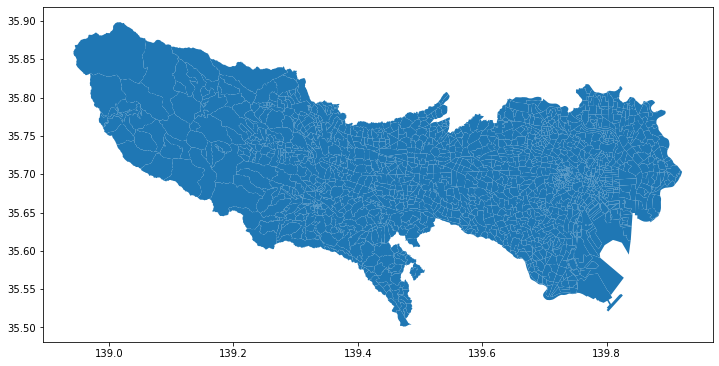

In [17]:
# Let's plot the geojson and check if the data shows correctly
# I am using the geopandas here because it is quick and easy 
dfgeo.plot(figsize=(12, 12))
plt.show()

In [18]:
## Now let's try using folium 
f = folium.Figure(width=800, height=500)
m = folium.Map(location=[35.69922743470978, 139.44493292784975],zoom_start=10, tiles='CartoDB positron').add_to(f)
oazamap = folium.GeoJson(data=dfgeo,style_function=lambda x: {'fillColor': 'orange'})
oazamap.add_to(m)
m

I have built two datasets so far - one containing average rent data for Tokyo districts and another containing spatial information of district boundaries. Now I need to join these two datasets in order to visualize rent data in a spatial context. For this join, I need to build a column that will serve as the KEY connecting both datasets. 
<p>
This column will be S_NAME_SH and it will be a simple concatenation of city + S_NAME_SH. This is not a very reliable way to build a KEY - it could happen that some areas have very common names which might generate duplicate KEYs - but it should suffice for this particular project since the scope is only Tokyo.      
<p>    
Usually, data that is used for geospatial analysis has area codes that are consistent with official data. Since I had to change the granularity of the spatial data, no official area code is available for a smoother join. 

In [19]:
# Concatenate city and S_NAME_SH so that I can join this data with the geojson. I wish I had a proper area code here, but we need to work with what we have...   
df = df.rename({"oaza":"S_NAME_SH"}, axis=1)
df["S_NAME_SH"] = df["city"]+df["S_NAME_SH"]
df

,Unnamed: 0,city,S_NAME_SH,code,1R,1K,1LDK,2LDK,3LDK,link
0,0,千代田区,千代田区飯田橋,13101001,NaN,9.40,21.30,NaN,NaN,/tokyo/area/13101001/rent/
1,1,千代田区,千代田区岩本町,13101003,10.35,9.42,16.39,NaN,NaN,/tokyo/area/13101003/rent/
2,2,千代田区,千代田区内神田,13101004,NaN,9.85,NaN,NaN,NaN,/tokyo/area/13101004/rent/
3,3,千代田区,千代田区神田小川町,13101013,NaN,12.00,NaN,NaN,NaN,/tokyo/area/13101013/rent/
4,4,千代田区,千代田区神田佐久間町,13101018,NaN,9.70,13.10,NaN,NaN,/tokyo/area/13101018/rent/
...,...,...,...,...,...,...,...,...,...,...
1271,1271,西東京市,西東京市向台町,13229020,4.20,4.80,NaN,NaN,27.0,/tokyo/area/13229020/rent/
1272,1272,西東京市,西東京市柳沢,13229021,NaN,6.50,NaN,NaN,NaN,/tokyo/area/13229021/rent/
1273,1273,西東京市,西東京市谷戸町,13229022,6.10,6.65,NaN,NaN,NaN,/tokyo/area/13229022/rent/
1274,1274,西多摩郡瑞穂町,西多摩郡瑞穂町大字箱根ケ崎,13303008,NaN,NaN,NaN,NaN,NaN,/tokyo/area/13303008/rent/


Now I write the code that will generate the map I want. 
<p>
Folium syntax is not very hard, but sometimes I do get stuck and need to spend some time looking for guidance on the web (quite scarce). It is very nice to be able to produce these kinds of map in Python, but i find QGIS way easier to get the hang of it and build great maps with ease. For example, I gave up trying to adjust the scale so that it shows only the selected flat type. It is showing two different scales at the same time... 

In [20]:
# Build the choropleth map

# Import colormap
from branca.colormap import linear

# Set basic settings of the map (center point, dimensions, style of the background, etc)
m = folium.Map(location=[35.69, 139.46861407206652],zoom_start=11, tiles=None)
base_map = folium.FeatureGroup(name='Basemap', overlay=True, control=False)
folium.TileLayer(tiles='cartodb positron').add_to(base_map)
base_map.add_to(m)

# Set 5 selectable feature groups - one for each flat type. 1K flats will be selected by default.
feature_group1 = folium.FeatureGroup("1K", overlay=False, show=False)
feature_group2 = folium.FeatureGroup("1R", overlay=False, show=True)
feature_group3 = folium.FeatureGroup("1LDK", overlay=False, show=False)
feature_group4 = folium.FeatureGroup("2LDK", overlay=False, show=False)
feature_group5 = folium.FeatureGroup("3LDK", overlay=False, show=False)

# EDIT: I set the map to show only 2 flat types.   
# I was having long loading times and the output html was heavier than what Github would let me upload for free... 
typelist = ["1K","1LDK"]
feats = [feature_group1,feature_group3]

# Build map
for k, c in zip(typelist, feats):
    choropleth1 = folium.Choropleth(
        geo_data=dfgeo,
        data=df,
        bins=6,
        name="choropleth",
        columns=['S_NAME_SH',k],
        key_on='feature.properties.S_NAME_SH',
        legend_name="legend",
        fill_color="YlOrBr",
        smooth_factor=0.4,
        fill_opacity=0.6,
        line_opacity=0.1).geojson.add_to(c)
    folium.features.GeoJsonTooltip(["S_NAME_SH"], labels=False).add_to(choropleth1)

    # Build Scale
    colormap = linear.YlOrBr_09.scale(df[k].min(),df[k].max()).to_step(6)
    colormap.caption = 'House Rent in 10,000 Yen ('+k+')'
    colormap.add_to(m)
    
    m.add_child(c)

# Set Map Title
loc = 'Average House Rent Prices - Tokyo'
title_html = '''
             <h3 align="left" style="font-size:33px"><b>{}</b></h3>
             '''.format(loc)   
m.get_root().html.add_child(folium.Element(title_html))

# Add LayerControl
folium.LayerControl(collapsed=False).add_to(m)

# Export to html
m.save("chintai_tokyo.html")

Check the html version of the map!

The lets the user to choose from 1K and 1LDK flat types. I could have set it show other flat types as well, but the map was getting quite heavy and there were lots of missing data for flats bigger than 1LDK. See below a quick discussion:

- Tokyo is expensive to live in so most flats listed in Chintai.net are small 1R and 1K apartments for young professionals living alone. 1LDK can still be found but as the map shows, data starts to go missing in many districts. I am sure there are apartments bigger than 1K in Tokyo, but for some reason the average rental for these types of flat were not calculated in Chintai.net (probably because they set a threshold of how many flats they need to have or how old the buildings need to be to calculate a reliable/comparable market average) 
- Map shows that Tokyo's most expensive areas are around the Tokyo Imperial Palace. The area south of it, between Minato and Shibuya, is particular expensive (1K: 120-140,000 yen/month) with Minami-Aoyama, Akasaka, and Roppongi standing out very brow! These are the areas inhabited by directors of investment banks, TV celebrities, diplomats, and CEOs of multinational companies.  
- As you go west, rent prices decline substially to 20,000 to 60,000 yen. Some of these areas are quite remote (top of mountains or middle of the forest) and commuting to central Tokyo might take up to 2 hours.

This is the end of Project Flat. Thank you for reading! 